# **Lab 5.2 Denoise & Deblur image with Autoencoder**

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader,Subset
from torch.utils.tensorboard import SummaryWriter
import copy

import numpy as np
import cv2
import os
import random
from skimage.util import random_noise
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm

## Data Preparation
Complete the class `CustomImageDataset()` that `__getitem__` return ***noisy blury*** image and ***ground truth*** image.
Please ensure that the final image is in RGBscale and has a size of 128x128.
The gaussian blur kernel size parameter should be random in the range [3,11]
and gaussian noise mean should be randoom in range [-50,50].

Parameters:
- image_paths: A list of paths to the images to be loaded.
- gauss_noise: A boolean flag to indicate if Gaussian noise should be added to the image.
- gauss_blur: A boolean flag to indicate if Gaussian blur should be applied to the image.
- resize: The size to which the image should be resized.
- p: Probability of applying certain transformations (like Gaussian noise or blur).

<b>Noise Mean</b>: The noise mean represents the average value added to each pixel during the noise generation process.
- Negative values: Shift the pixel values towards darker intensities.
- Positive values: Shift the pixel values towards brighter intensities.

<b> kernel size</b>: determines the dimensions of the Gaussian blur filter applied to the image.
- Larger kernel sizes: Produce more pronounced blurring effects, smoothing out image details.
- Smaller kernel sizes: Result in less blurring, preserving more image details.

In [2]:
### START CODE HERE ###
class CustomImageDataset(torch.utils.data.Dataset):
    def __init__(self, image_paths, resize=128, crop_size=128, gauss_noise=False, gauss_blur=False, p=0.5):
        self.image_paths = image_paths
        self.resize = resize
        self.crop_size = crop_size
        self.gauss_noise = gauss_noise
        self.gauss_blur = gauss_blur
        self.p = p

    def __len__(self):
        return len(self.image_paths)

    def clip_to_uint8(self, image):
        """Clips image values to the range of 0-255 (uint8 format)"""
        return np.clip(image * 255.0, 0, 255).astype(np.uint8)  # Rescale and clip

    def __getitem__(self, idx):
        image = cv2.imread(self.image_paths[idx])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize and crop
        image = cv2.resize(image, (self.resize, self.resize))
        
        h, w, _ = image.shape
        start_x = (w - self.crop_size) // 2
        start_y = (h - self.crop_size) // 2
        image = image[start_y:start_y+self.crop_size, start_x:start_x+self.crop_size]

        # Ground truth
        gt_image = image.copy()

        # Augmentations
        if random.random() < self.p:
            if self.gauss_noise:
                # Add Gaussian noise
                noise_mean = random.uniform(-50, 50)
                var = 0.01
                noise = random_noise(image.astype(np.float32) / 255.0, mode='gaussian', var=var)  # var controls noise level
                image = image.astype(np.float32) / 255.0 + noise
                image = np.clip(image * 255.0, 0, 255).astype(np.uint8)  # Clip after adding noise
                #print(f"noise_mean: {noise_mean:.3f}", end=",\t")

            if self.gauss_blur:
                kernel_size = random.randint(3, 11)
                kernel_size = kernel_size if kernel_size % 2 == 1 else kernel_size + 1
                sigmaX = kernel_size / 3
                image = cv2.GaussianBlur(image, (kernel_size, kernel_size), sigmaX)
                #print("kernel_size", kernel_size)

        # Preprocess for PyTorch
        image = image.astype(np.float32) / 255.0
        gt_image = gt_image.astype(np.float32) / 255.0
        image = torch.from_numpy(image).permute(2, 0, 1)
        gt_image = torch.from_numpy(gt_image).permute(2, 0, 1)

        return image, gt_image
### END CODE HERE ###

Use your [`CustomImageDataset()`](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html#:~:text=transformed_dataset%20%3D%20FaceLandmarksDataset,3%3A%0A%20%20%20%20%20%20%20%20break)  to load the dataset in the cell below. Then, display the image from the first batch.

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

- Noisy blury images (this reference use salt and pepper noise)<br>
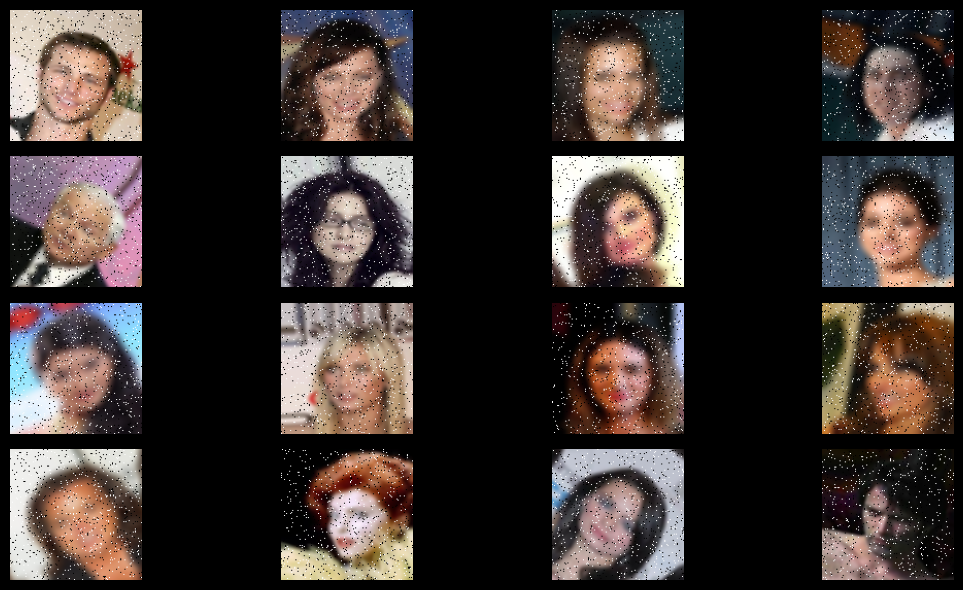

- Ground Truth images<br>
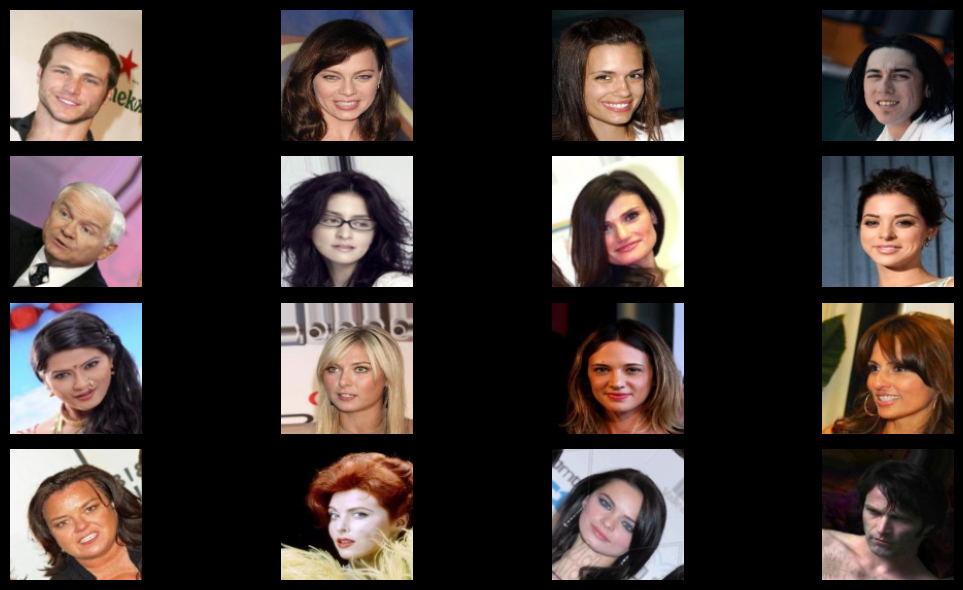

</details>

Complete the function below

In [3]:
### START CODE HERE ###
def convert_tensor_to_image(tensor, normalize=True):
    """
    Convert a tensor to a numpy image array.
    
    Parameters:
    - tensor (torch.Tensor): Input tensor of shape (C, H, W) or (N, C, H, W).
    - normalize (bool): Whether to normalize the image data to the range [0, 1].
    
    Returns:
    - np.ndarray: Image array with shape (H, W, C) for a single image or (N, H, W, C) for a batch.
    """
    if tensor.ndimension() == 4:
        # Batch of images
        tensor = tensor[0]  # Take the first image in the batch
        
    # Convert to numpy
    image = tensor.cpu().numpy().transpose(1, 2, 0)
    
    # Normalize to [0, 1] if needed
    if normalize:
        image = (image - np.min(image)) / (np.max(image) - np.min(image))
        image = np.clip(image * 255, 0, 255).astype(np.uint8)
    
    return image

def imshow_grid(images, normalize=True, cmap=None):
    """
    Display a grid of images.
    
    Parameters:
    - images (list of torch.Tensor or np.ndarray): List of images to display.
    - normalize (bool): Whether to normalize images before displaying.
    - cmap (str or None): Colormap for grayscale images (e.g., 'gray'). None for color images.
    """
    num_images = len(images)
    sqrt_n = int(np.ceil(np.sqrt(num_images)))
    fig, axes = plt.subplots(sqrt_n, sqrt_n, figsize=(sqrt_n*2, sqrt_n*2))
    axes = axes.flatten()
    
    for i in range(num_images):
        # Convert tensor to image
        if isinstance(images[i], torch.Tensor):
            image = convert_tensor_to_image(images[i], normalize)
        else:
            image = images[i]

        # Determine if the image is grayscale or color
        if cmap:  # Apply colormap if specified
            if image.ndim == 3 and image.shape[2] == 3:
                # Convert color image to grayscale using average method
                image_gray = np.mean(image, axis=2)
                axes[i].imshow(image_gray, cmap=cmap)
            else:
                axes[i].imshow(image, cmap=cmap)
        else:
            axes[i].imshow(image)
            
        axes[i].axis('off')
    
    # Hide any remaining axes
    for j in range(num_images, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()
### END CODE HERE ###

In [4]:
### START CODE HERE ###
data_dir = "images/img_align_celeba/"
image_paths = [os.path.join(data_dir, img) for img in os.listdir(data_dir)]
print("Size:",len(image_paths))

dataset = CustomImageDataset(image_paths, gauss_noise=True, gauss_blur=True)
batch_size = 16
dataloader = DataLoader(dataset, batch_size=batch_size)
### END CODE HERE ###

Size: 13882


Noisy blury images


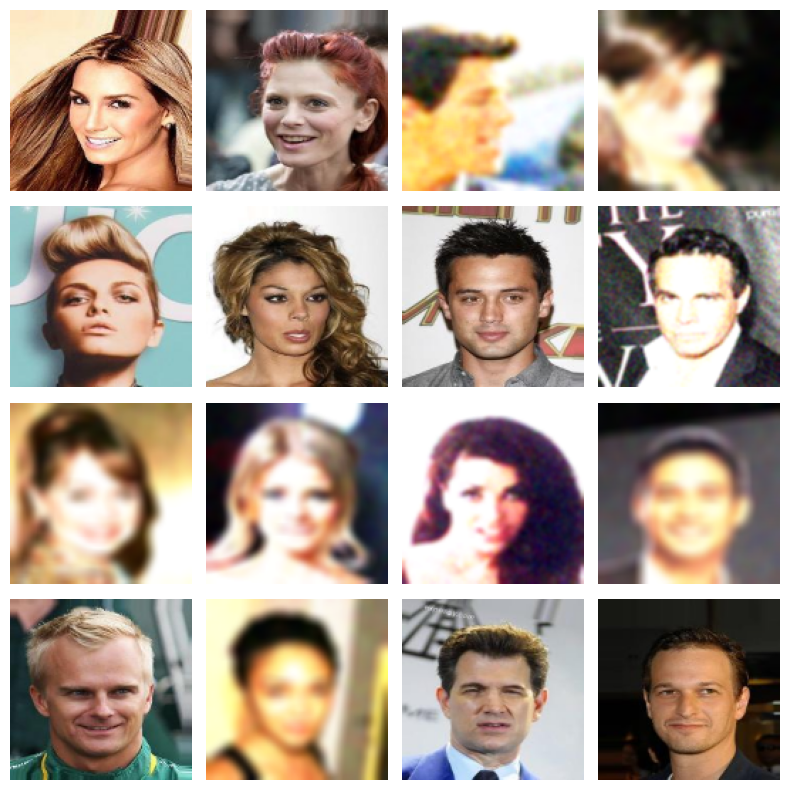

Ground Truth images


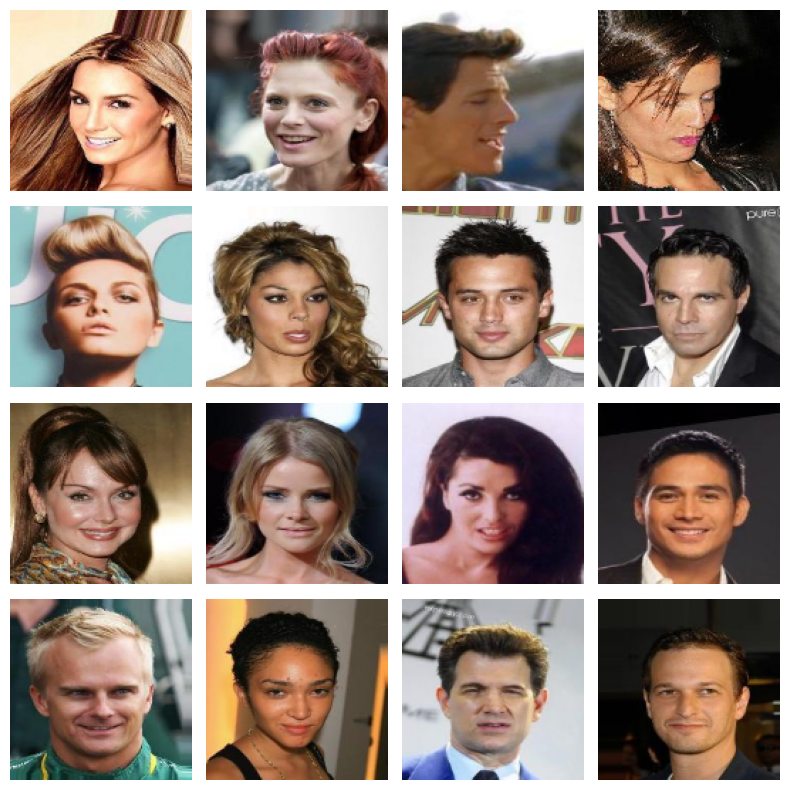

In [5]:
### START CODE HERE ###
batch, gt_img = next(iter(dataloader))

#print("-"*100)
# Display the first image and its ground truth
print("Noisy blury images")
imshow_grid(batch[:batch_size])
print("Ground Truth images")
imshow_grid(gt_img[:batch_size])
### END CODE HERE ###

## Create Autoencoder model
You can design your own Autoencoder model based on the provided code below. However, please maintain the concept of 'Autoencoder'.
[Read more.](https://pytorch.org/tutorials/beginner/introyt/modelsyt_tutorial.html)

In [6]:
### START CODE HERE ###
class DownSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(DownSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.pool(x)
        return x

class UpSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(UpSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.upsample(x)
        return x


class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()

        # Encoder
        self.conv_in = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1)
        self.down1 = DownSamplingBlock(64, 128)
        self.down2 = DownSamplingBlock(128, 256)
        
        # Latent Space
        self.latent = nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1)

        # Decoder
        self.up1 = UpSamplingBlock(512, 256)
        self.up2 = UpSamplingBlock(256, 128)
        self.up3 = UpSamplingBlock(128, 64)

        # Final Convolution to get the original image size
        self.conv_out = nn.Conv2d(64, 3, kernel_size=3, stride=1, padding=1)

    def forward(self, x):
        # Encoder
        x = self.conv_in(x)          # Shape: [batch_size, 64, 128, 128]

        x = self.down1(x)           # Shape: [batch_size, 128, 64, 64]
        x = self.down2(x)           # Shape: [batch_size, 256, 32, 32]

        # Latent Space
        x = self.latent(x)          # Shape: [batch_size, 512, 32, 32]

        # Decoder
        x = self.up1(x)             # Shape: [batch_size, 256, 64, 64]
        x = self.up2(x)             # Shape: [batch_size, 128, 128, 128]
        x = self.up3(x)             # Shape: [batch_size, 64, 256, 256]

        # Resize to match the input size (128x128)
        x = F.interpolate(x, size=(128, 128), mode='bilinear', align_corners=True)

        # Final Convolution to get the original image size
        x = self.conv_out(x)        # Shape: [batch_size, 3, 128, 128]

        return x
### END CODE HERE ###

If you define your model class correcly, the cell below should run without any errors.

In [7]:
model = Autoencoder()
print(model)

Autoencoder(
  (conv_in): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (down1): DownSamplingBlock(
    (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down2): DownSamplingBlock(
    (conv): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (latent): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (up1): UpSamplingBlock(
    (conv): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (upsample): Upsample(scale_factor=2.0, mode='bilinear')
  )
  (up2): UpSamplingBlock(
    (conv): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (upsample): Upsample(scale_factor=2.0, mode='bilinear')
  )
  (up3): UpS

## Train Autoencoder
Complete the `train()` function in the cell below. This function should evaluate the model at every epoch, log the ***training loss, test loss,test PSNR, test SSIM***. Additionally, it should save the model at the last epoch.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The log should resemble this, but not be identical

```
🤖Training on cuda
🚀Training Epoch [1/1]: 100%|██████████| 1313/1313 [01:45<00:00, 12.41batch/s, loss=0.0102] 
📄Testing: 100%|██████████| 563/563 [01:10<00:00,  7.95batch/s, loss=0.0106, psnr=16.7, ssim=0.348] 
Summary :
	Train	avg_loss: 0.017262999383663165
	Test	avg_loss: 0.010476540363861867 
                PSNR : 16.839487147468034 
                SSIM : 0.36090552368883694
...
```

</details>

Resource : [PyTorch Training loop](<https://pytorch.org/tutorials/beginner/introyt/trainingyt.html#:~:text=%3D0.9)-,The%20Training%20Loop,-Below%2C%20we%20have>), [PSNR & SSIM](https://ieeexplore.ieee.org/document/5596999)

In [8]:
### START CODE HERE ###
def train(model, opt, loss_fn, train_loader, test_loader, epochs=10, checkpoint_path=None, device='cpu'):
    print(f"🤖 Training on {device}")
    model = model.to(device)
    
    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        train_bar = tqdm(train_loader, desc=f'🚀 Training Epoch [{epoch+1}/{epochs}]', unit='batch', leave=False)
        for images, gt in train_bar:
            images, gt = images.to(device), gt.to(device)
            
            opt.zero_grad()
            output = model(images)
            
            if output.shape != gt.shape:
                raise ValueError(f"Output shape {output.shape} does not match ground truth shape {gt.shape}")

            loss = loss_fn(output, gt)
            loss.backward()
            opt.step()
            
            train_loss += loss.item()
            avg_train_loss = train_loss / (train_bar.n + 1)
            train_bar.set_postfix(loss=f"{avg_train_loss:.4f}")

        avg_train_loss = train_loss / len(train_loader)
        print(f"\nEpoch [{epoch+1}/{epochs}] - Average Training Loss: {avg_train_loss:.4f}")
        
        model.eval()
        test_loss = 0.0
        psnr_values = []
        ssim_values = []
        test_bar = tqdm(test_loader, desc=f'📄 Testing Epoch [{epoch+1}/{epochs}]', unit='batch', leave=False)
        with torch.no_grad():
            for images, gt in test_bar:
                images, gt = images.to(device), gt.to(device)
                output = model(images)
                
                if output.shape != gt.shape:
                    raise ValueError(f"Output shape {output.shape} does not match ground truth shape {gt.shape}")
                
                loss = loss_fn(output, gt)
                test_loss += loss.item()
                
                for i in range(images.size(0)):
                    gt_image = gt[i].cpu().numpy().transpose(1, 2, 0)
                    output_image = output[i].cpu().numpy().transpose(1, 2, 0)

                    data_range=255.0 # Assuming images are normalized in the range [0, 255]
                    
                    psnr_value = psnr(gt_image, output_image, data_range=data_range)
                    ssim_value = ssim(gt_image, output_image, multichannel=True, win_size=3, data_range=data_range)
                    
                    psnr_values.append(psnr_value)
                    ssim_values.append(ssim_value)
                
                avg_test_loss = test_loss / (test_bar.n + 1)
                test_bar.set_postfix(loss=f"{avg_test_loss:.4f}", psnr=f"{np.mean(psnr_values):.1f}", ssim=f"{np.mean(ssim_values):.3f}")

        avg_test_loss = test_loss / len(test_loader)
        avg_psnr = np.mean(psnr_values)
        avg_ssim = np.mean(ssim_values)
        
        print(f"\nSummary :")
        print(f"\tTrain\tavg_loss: {avg_train_loss:.6f}")
        print(f"\tTest\tavg_loss: {avg_test_loss:.6f}")
        print(f"\t\tPSNR : {avg_psnr:.6f}")
        print(f"\t\tSSIM : {avg_ssim:.6f}")

        if checkpoint_path:
            torch.save(model.state_dict(), checkpoint_path)
            print(f"Model saved to {checkpoint_path}")
### END CODE HERE ###

Let's train your model.

In [9]:
## START CODE HERE ###
data_dir = "images/img_align_celeba/"

files = os.listdir(data_dir)
files = [os.path.join(data_dir, file) for file in files]

# Split the dataset into training and testing sets
train_files, test_files = train_test_split(files, test_size=0.2, random_state=42)

train_dataset = CustomImageDataset(train_files, gauss_noise=True, gauss_blur=True)
test_dataset = CustomImageDataset(test_files, gauss_noise=True, gauss_blur=True)
trainloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
testloader = DataLoader(test_dataset, batch_size=16, shuffle=False)
## END CODE HERE ###

In [10]:
# data_dir = "images/img_align_celeba/"

# # List all image files in the directory
# files = os.listdir(data_dir)
# files = [os.path.join(data_dir, file) for file in files]

# # Define the size of the subsets
# train_size = 15  # Number of images for training
# test_size = 20     # Number of images for testing

# # Sample a small subset of files
# sampled_files = np.random.choice(files, size=train_size + test_size, replace=False)

# # Split the sampled files into training and testing sets
# train_files, test_files = train_test_split(sampled_files, test_size=test_size, random_state=42)

# # Create dataset objects with the option for augmentations like Gaussian noise and blur
# train_dataset = CustomImageDataset(train_files, gauss_noise=True, gauss_blur=True)
# test_dataset = CustomImageDataset(test_files, gauss_noise=True, gauss_blur=True)



# # Create DataLoaders for both training and testing datasets
# trainloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
# testloader = DataLoader(test_dataset, batch_size=16, shuffle=False)


# # Print the sizes of the datasets
# print(f"Number of training files: {len(train_files)}")
# print(f"Number of test files: {len(test_files)}")

In [11]:
### START CODE HERE ###
model = Autoencoder()
opt = optim.Adam(model.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

# Optionally specify a path to save the model
checkpoint_path = "autoencoder_checkpoint.pth"

# Train the model
train(model, opt, loss_fn, trainloader, testloader, epochs=1, checkpoint_path=checkpoint_path, device='cuda' if torch.cuda.is_available() else 'cpu')
### END CODE HERE ###

🤖 Training on cpu



Epoch [1/1] - Average Training Loss: 0.1146



Summary :
	Train	avg_loss: 0.114599
	Test	avg_loss: 0.022018
		PSNR : 65.196397
		SSIM : 0.997857
Model saved to autoencoder_checkpoint.pth


Let's use your trained model.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

- Input images<br>
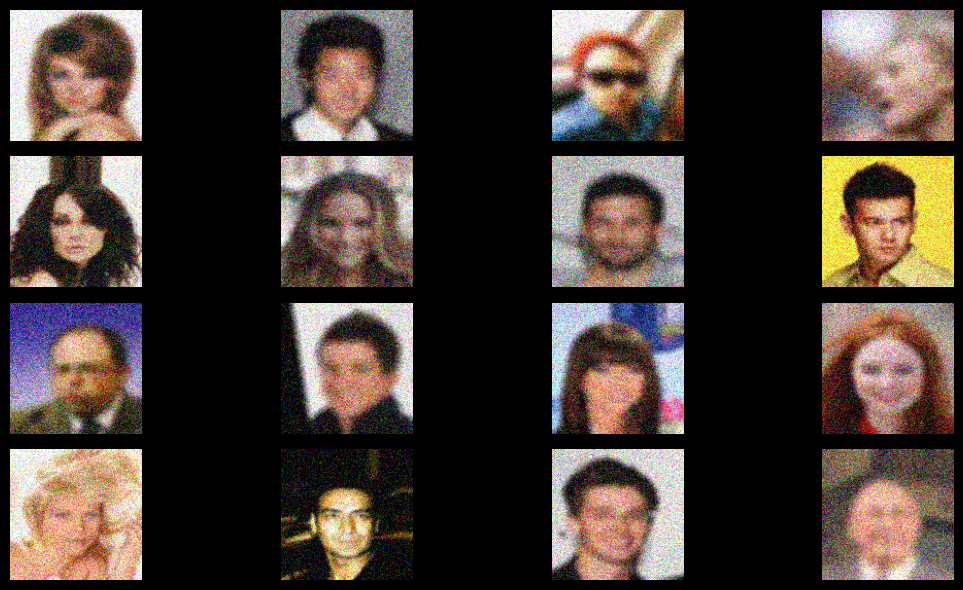

- Output images<br>
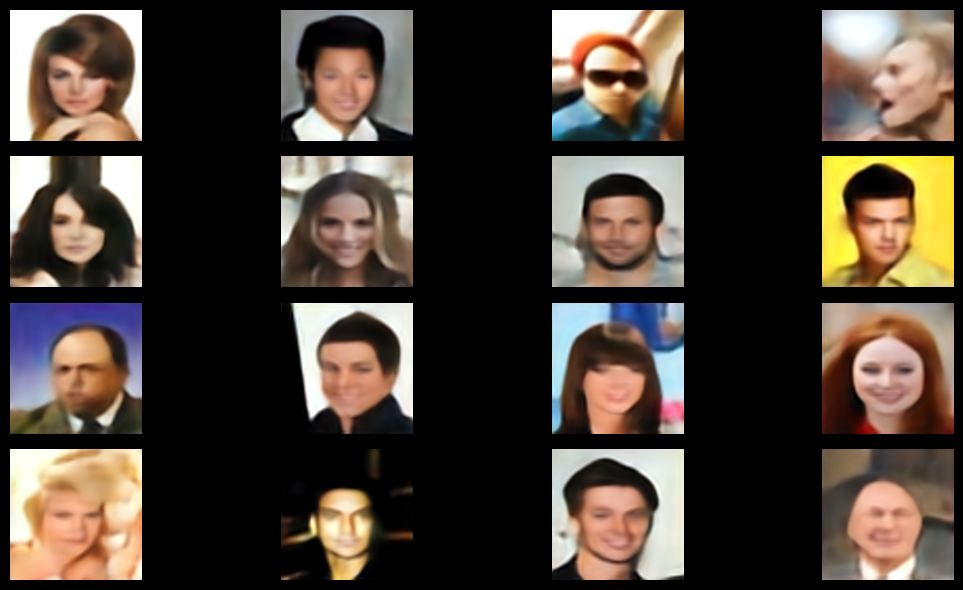

- Ground Truth images<br>
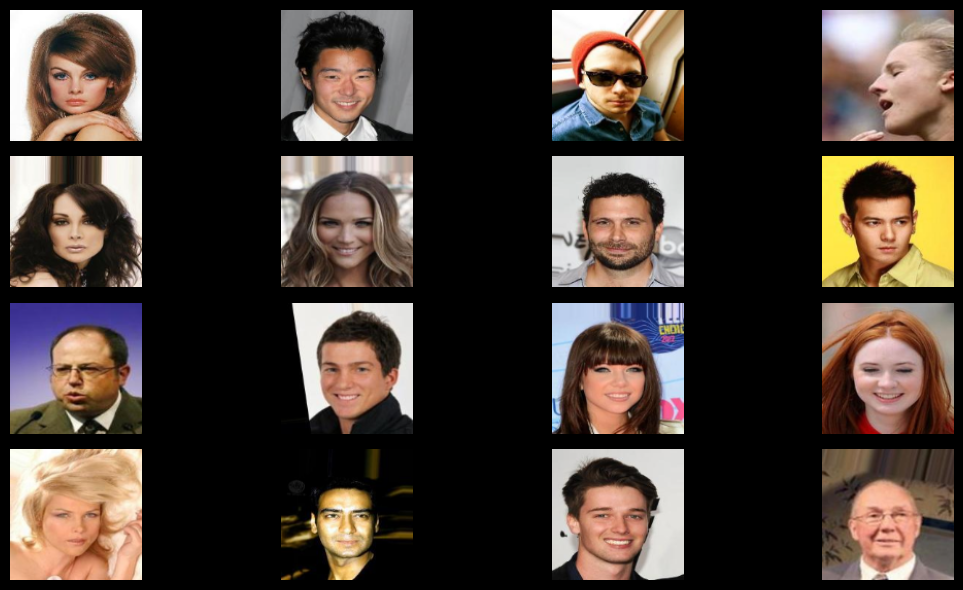

</details>

Displaying sample images:
Input images:


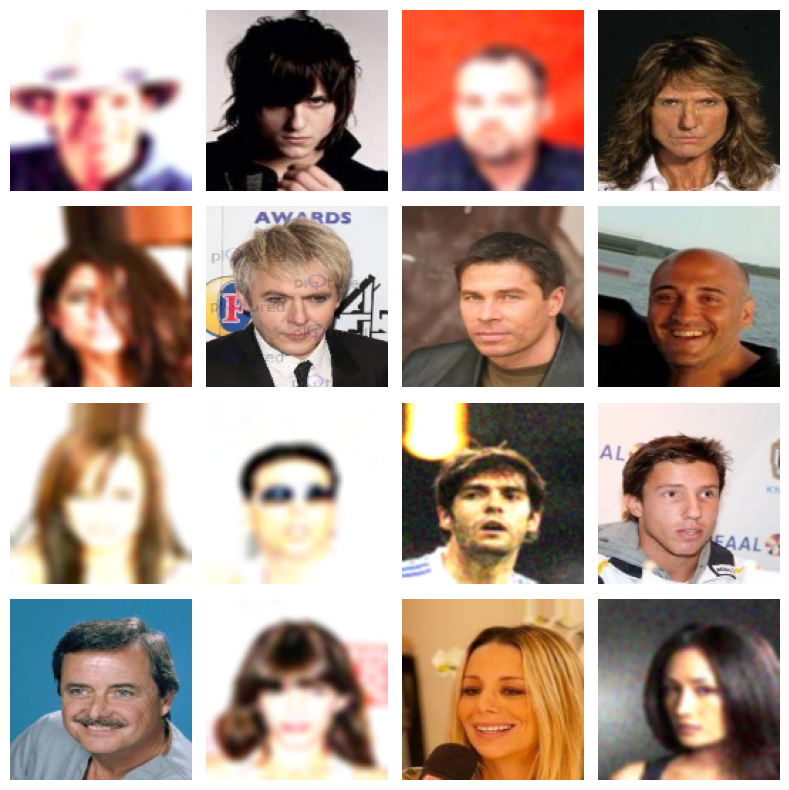

Output images:


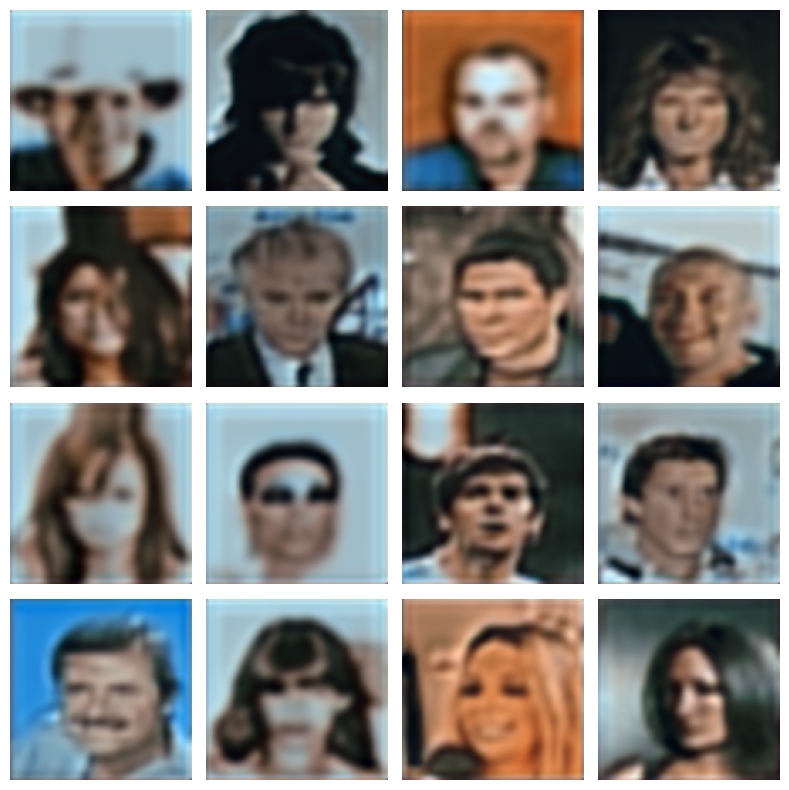

Ground Truth images:


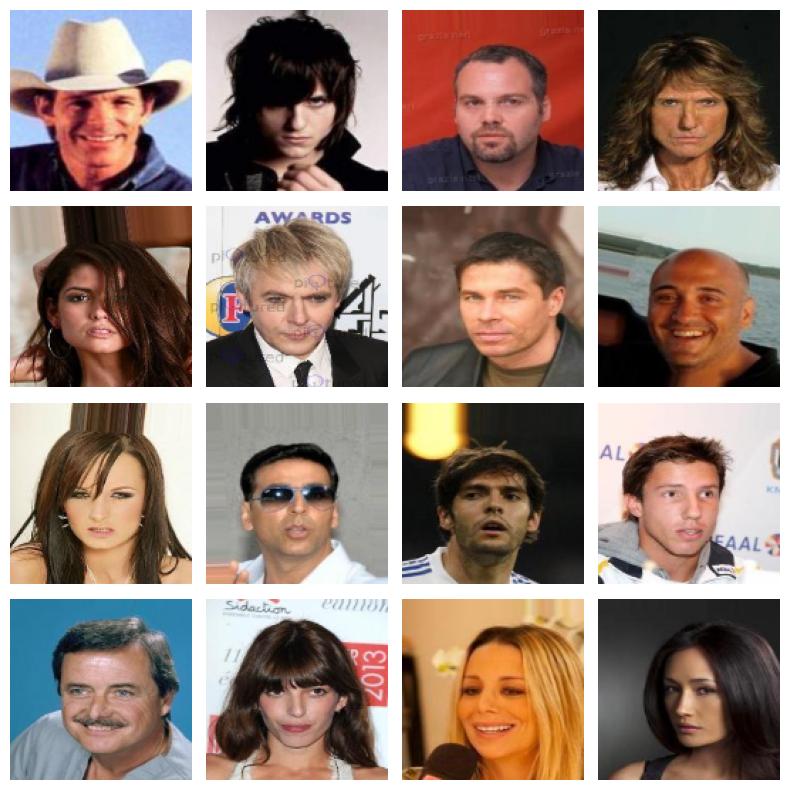

In [12]:
### START CODE HERE ###
# Define a function to display images
def display_sample_images(model, dataloader, device='cpu'):
    model.eval()
    with torch.no_grad():
        for images, gt in dataloader:
            images, gt = images.to(device), gt.to(device)
            outputs = model(images)
            # Convert images and outputs to CPU and numpy arrays
            images = images.cpu()
            gt = gt.cpu()
            outputs = outputs.cpu()

            # Prepare sample images for display
            num_samples = min(len(images), 16)  # Limit to 16 samples for display
            sample_images = [images[i] for i in range(num_samples)]
            sample_gts = [gt[i] for i in range(num_samples)]
            sample_outputs = [outputs[i] for i in range(num_samples)]

            print("Displaying sample images:")
            print("Input images:")
            imshow_grid(sample_images)  # Display input images
            print("Output images:")
            # print(sample_outputs[0].ndim )
            imshow_grid(sample_outputs)
            print("Ground Truth images:")
            imshow_grid(sample_gts)      # Display ground truth images
            
            break  # Only display the first batch

# Call the function with your model and data loader
display_sample_images(model, testloader, device='cuda' if torch.cuda.is_available() else 'cpu')
### END CODE HERE ###

## Explore feature map
Use the `FeatureExtractor()` class and `visualize_feature_map()` function to visualize the feature map of ***ALL*** layers or block of your model. Then, save it as an image.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

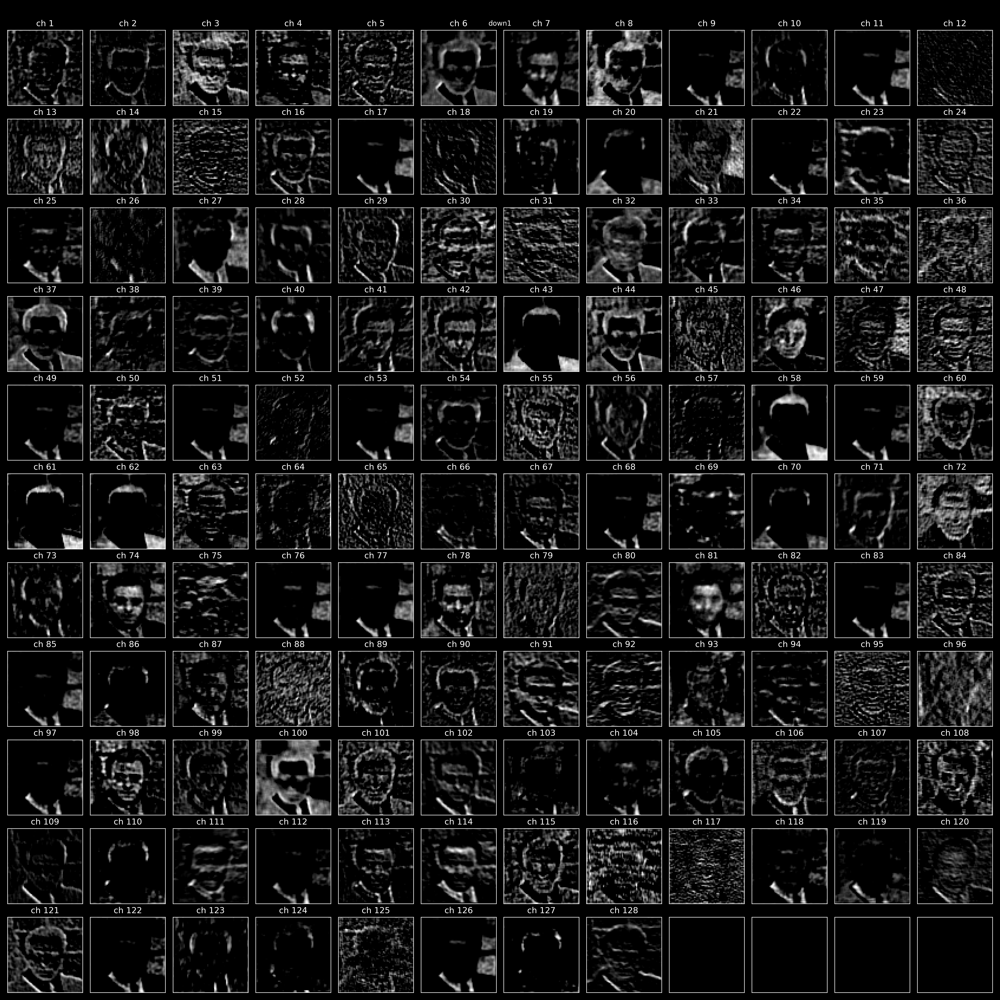
</details>

In [13]:
class FeatureExtractor(nn.Module):
    def __init__(self, model, target_layers):
        super(FeatureExtractor, self).__init__()
        self.model = copy.deepcopy(model)
        self.target_layers = target_layers
        self.features = []

        for layer_name, layer in self.model.named_modules():
            if layer_name in target_layers:
                layer.register_forward_hook(self.save_feature(layer_name))

    def save_feature(self, layer_name):
        def hook(module, input, output):
            self.features.append(output)
        return hook

    def forward(self, x):
        self.features = []
        self.model(x)
        return self.features

In [14]:
### START CODE HERE ###
def visualize_feature_map(x, base_filename, model, target_layers):
    # Initialize the FeatureExtractor
    feature_extractor = FeatureExtractor(model, target_layers)
    
    # Perform a forward pass to get feature maps
    feature_maps = feature_extractor(x)
    
    # Ensure output directory exists
    output_dir = os.path.dirname(base_filename)
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Check if feature maps were extracted correctly
    if not feature_maps:
        print("No feature maps extracted.")
        return
    
    # Loop through the feature maps and create subplots for each layer
    for i, feature_map in enumerate(feature_maps):
        # Get the number of feature maps in this layer
        num_feature_maps = feature_map.size(1)
        
        # Determine grid size for subplots
        grid_size = int(np.ceil(np.sqrt(num_feature_maps)))
        
        # Create a figure with subplots
        fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))
        axes = axes.flatten()  # Flatten the array for easy indexing

        for j in range(num_feature_maps):
            # Extract the j-th feature map
            fmap = feature_map[0, j].cpu().detach().numpy()
            
            # Handle normalization safely
            fmap_min = np.min(fmap)
            fmap_max = np.max(fmap)
            
            if fmap_max > fmap_min:  # Avoid division by zero
                fmap = (fmap - fmap_min) / (fmap_max - fmap_min)
            else:
                # If all values are the same, create an all-zero image
                fmap = np.zeros_like(fmap)
            
            # Display the feature map in the subplot
            axes[j].imshow(fmap, cmap='gray')
            # axes[j].imshow(fmap)
            axes[j].axis('off')  # Hide axis

        # Hide any unused subplots
        for k in range(num_feature_maps, len(axes)):
            axes[k].axis('off')

        # Set title for the subplot grid
        plt.suptitle(f"Layer: {target_layers[i]}", fontsize=16)
        
        # Construct the filename for saving the composite image
        layer_name = target_layers[i]
        safe_layer_name = layer_name.replace('/', '_').replace(':', '_')  # Make the layer name filesystem-safe
        filename = f"{base_filename}_{safe_layer_name}.png"
        
        # Save the figure
        plt.savefig(filename, bbox_inches='tight', pad_inches=0)
        # print(f"Saved feature map image to {filename}")
        
        # Display the plot in VS Code's interactive window
        plt.show()
### END CODE HERE ###


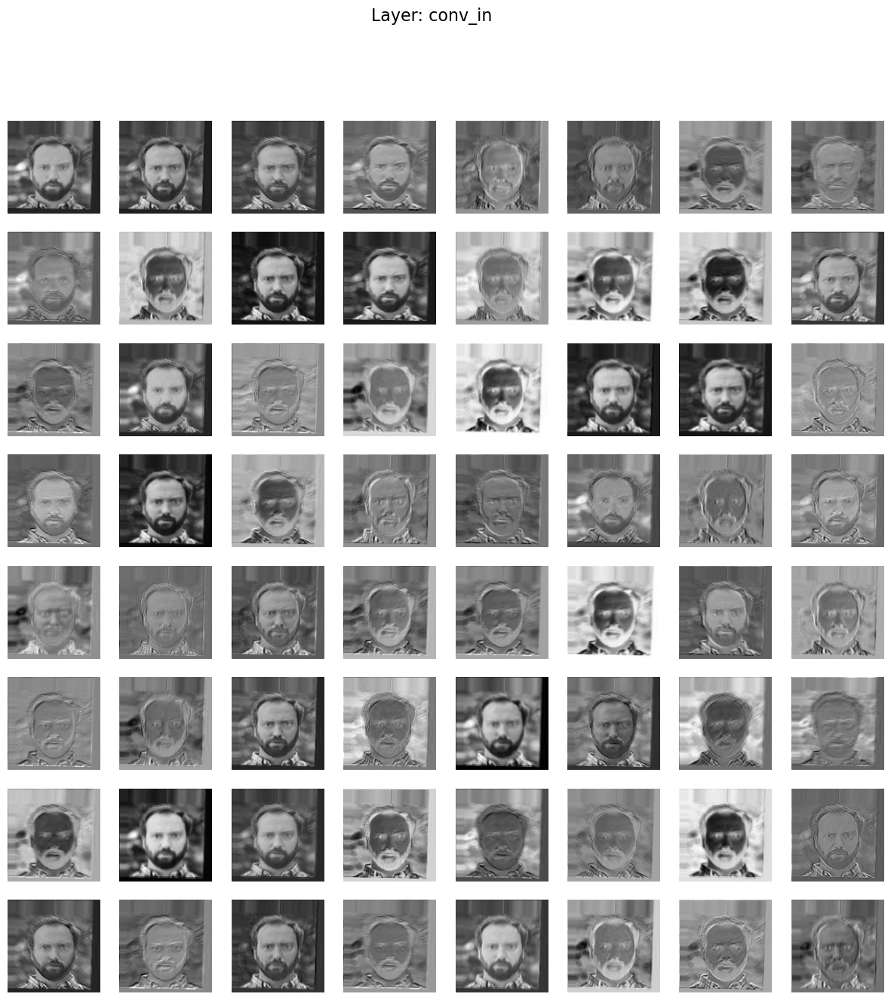

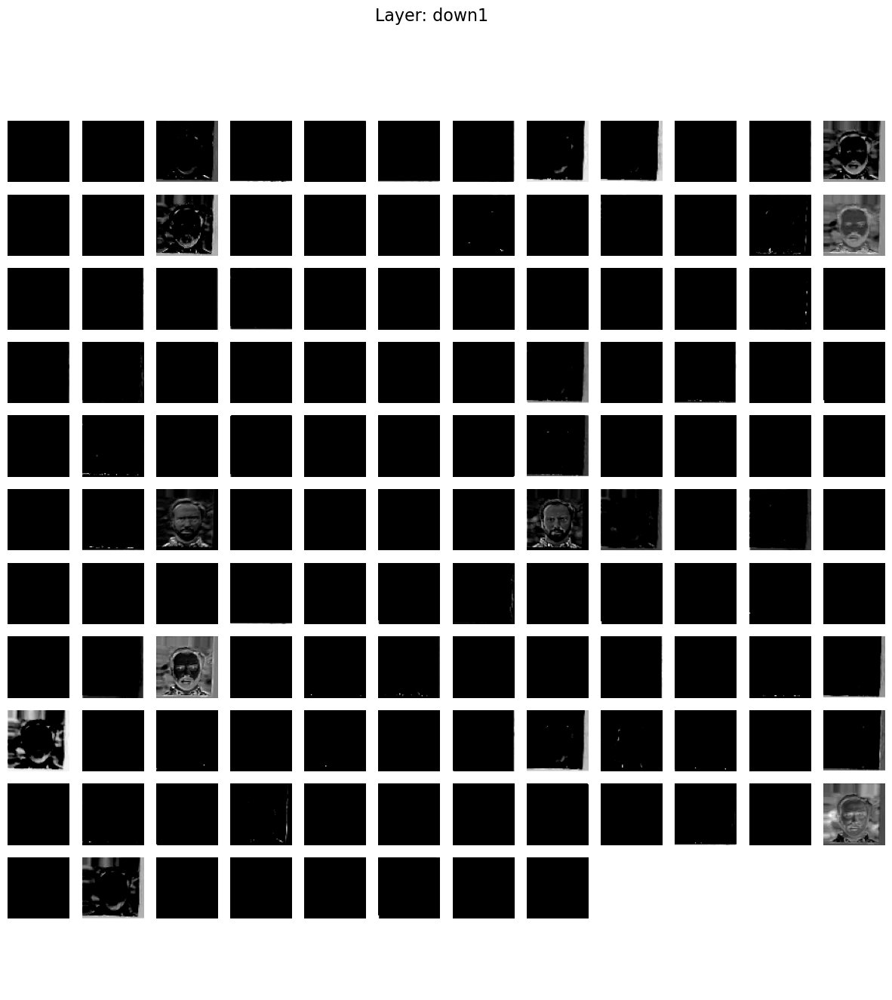

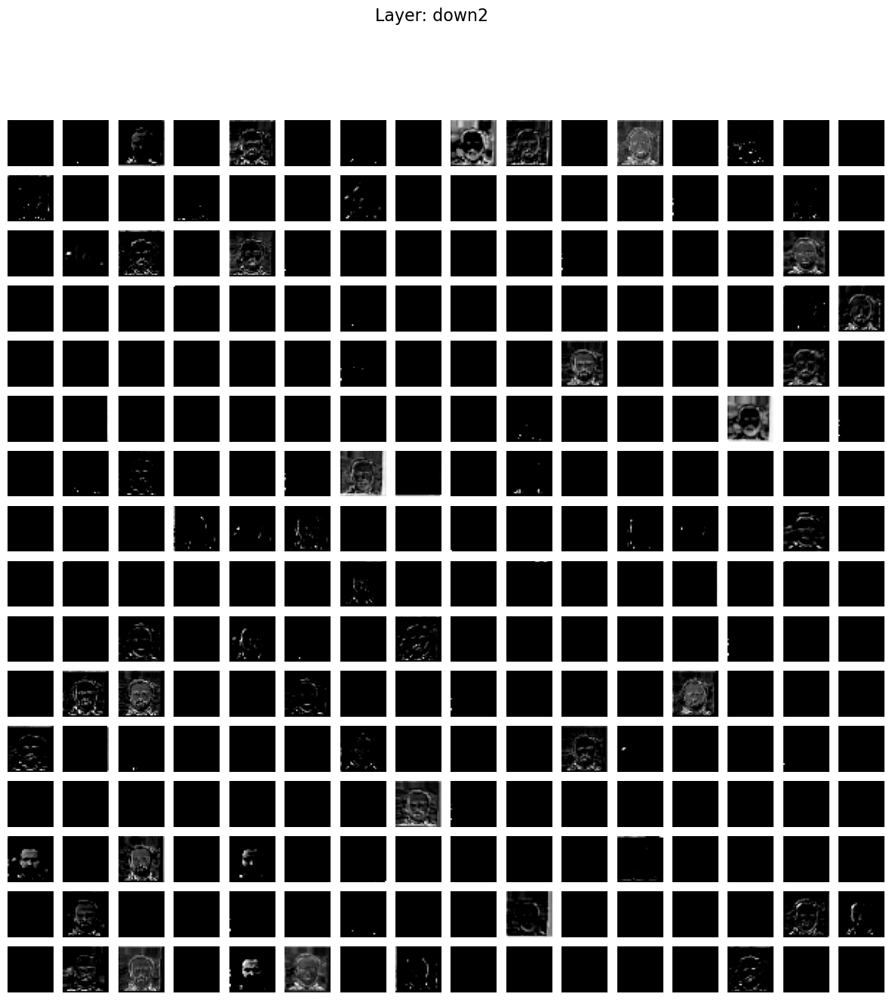

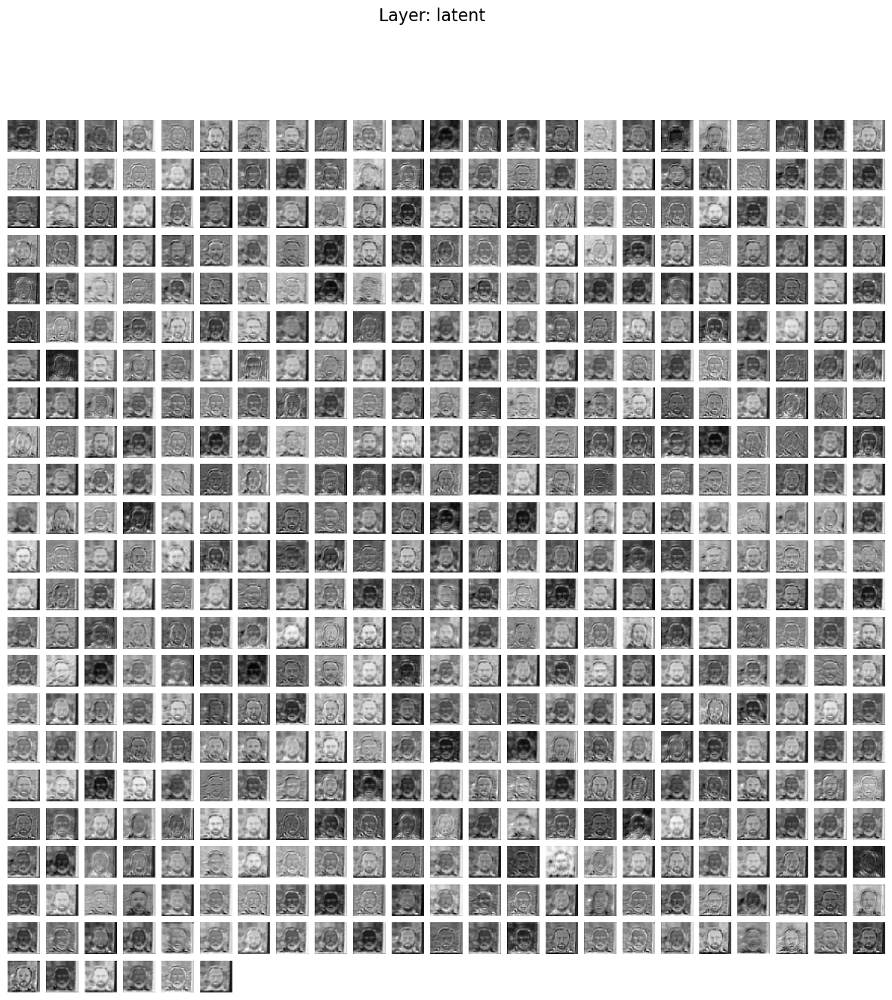

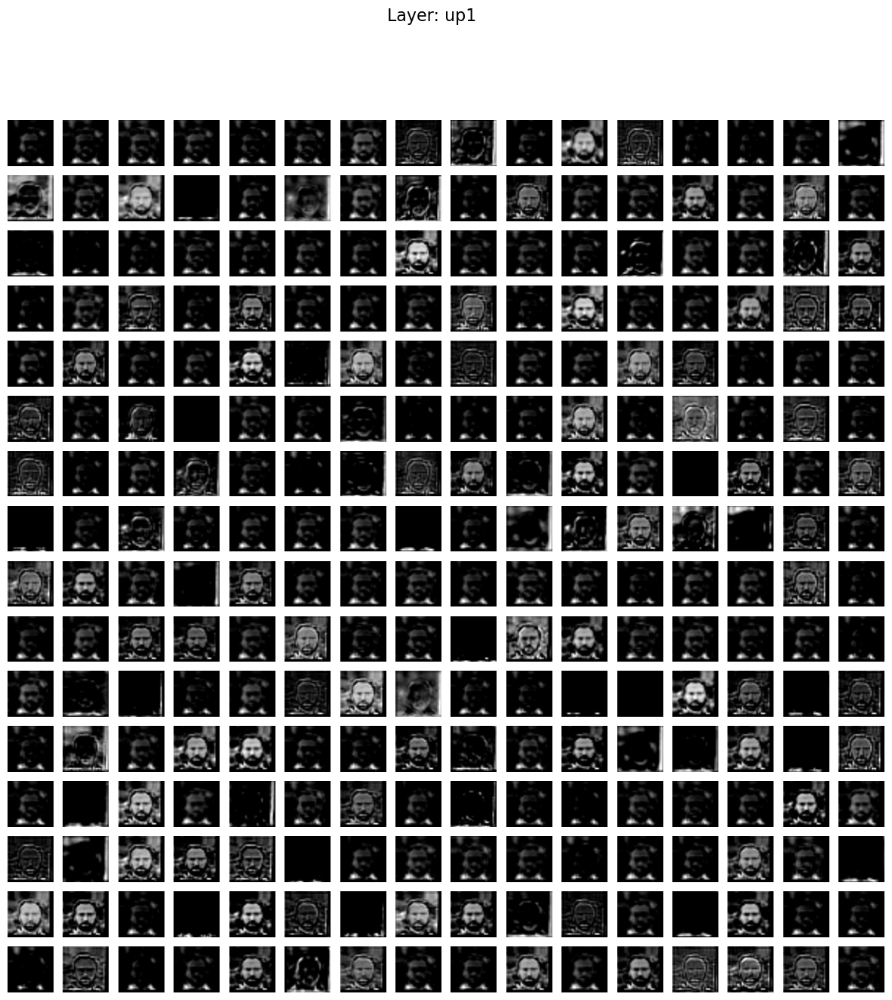

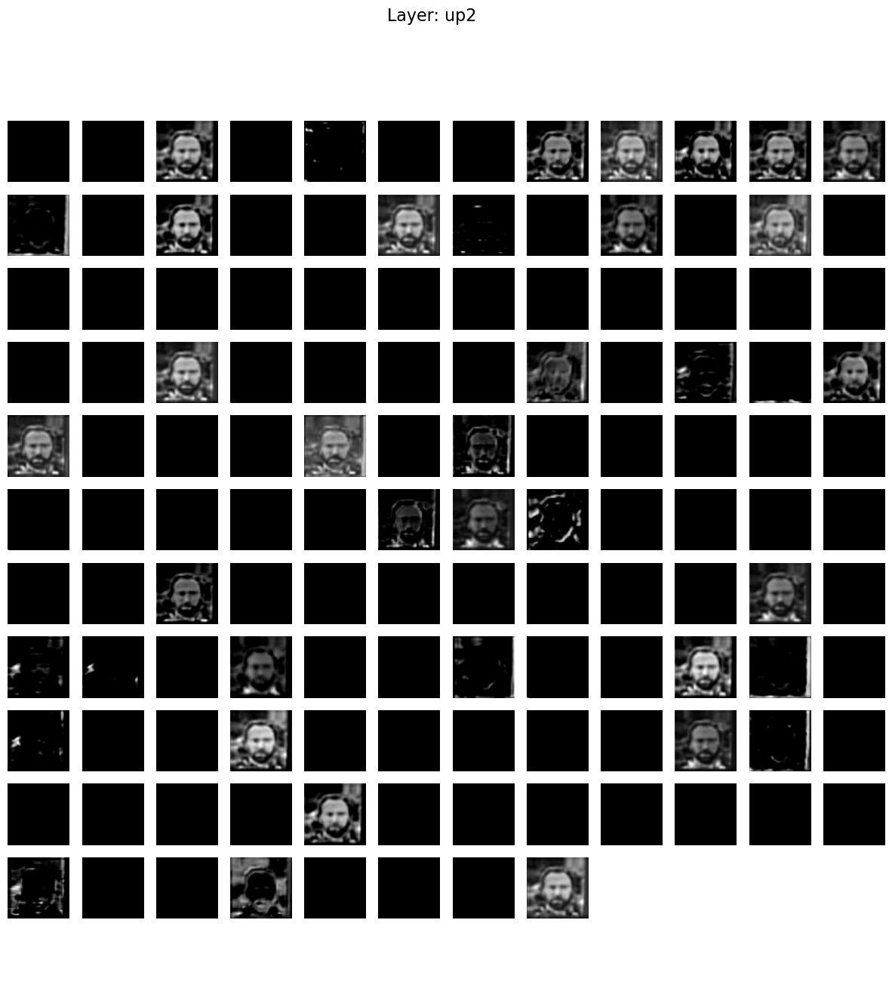

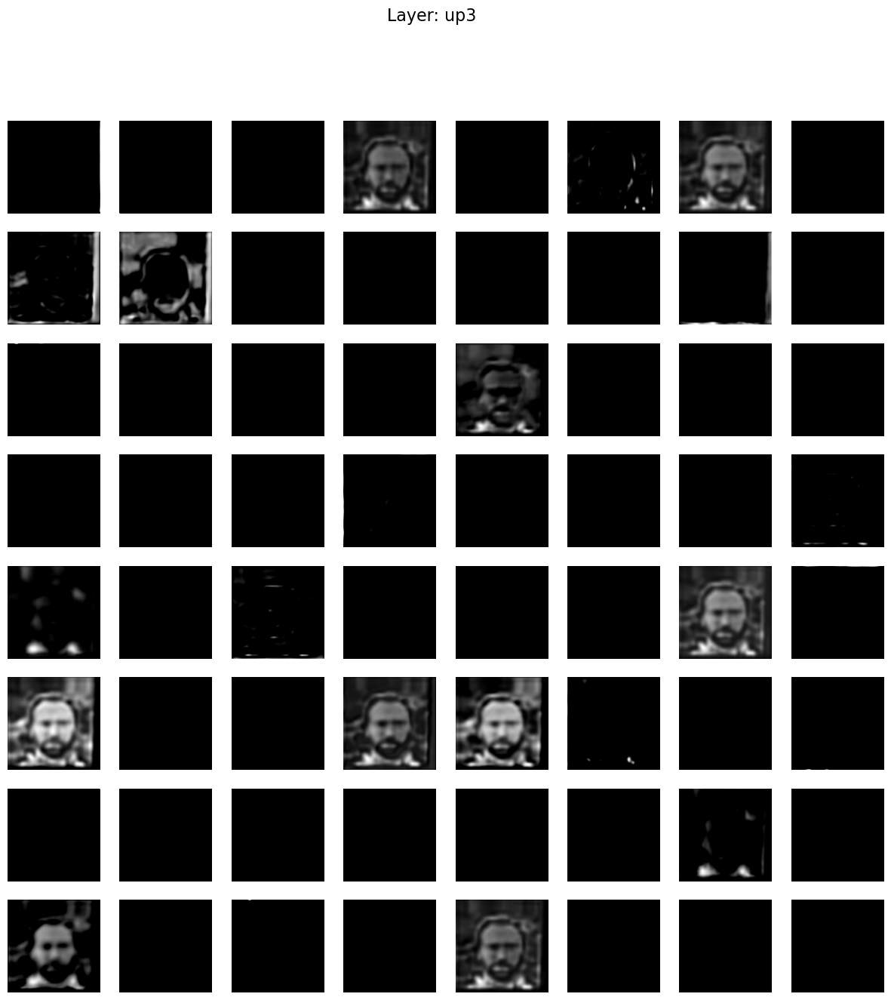

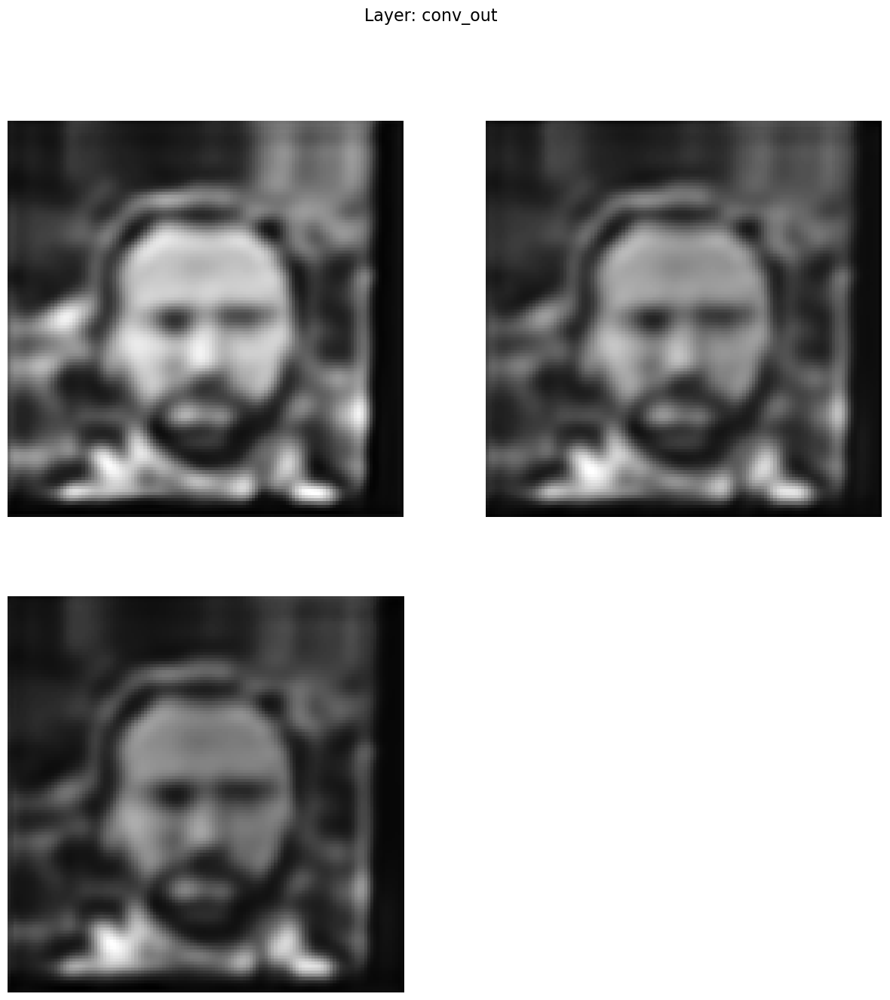

In [15]:
### START CODE HERE ###
target_layers = [
    'conv_in', 'down1', 'down2', 'latent', 
    'up1', 'up2', 'up3', 'conv_out'
]

# target_layers = [
#      'down1'
# ]

# Use a single image from your DataLoader for visualization
data_iter = iter(trainloader)
x, _ = next(data_iter)  # Get a batch from the DataLoader
x = x[0].unsqueeze(0)  # Add batch dimension

visualize_feature_map(x, "feature_maps/feature_map", model, target_layers)
### END CODE HERE ###

---

# Questions:
1. Explain how changing the number of layers and the number of nodes in a Convolutional Neural Network (CNN) affects its performance (model accuracy, training time, and generalization/overfitting?  
2. Explain a comparison of PSNR and SSIM values (objective measurment) to your eye perception (subjective measurement) and suggest the criteria for High, Medium, Low image quality.
3. Explain a comparison of the autoencoder results between training without/with augmentation by visualizing feature maps at each layer.
4. Ranking the autoencoder performance in terms of PSNR and SSIM for each augmentation technique. Which augmentation techiques are mostly affect the autoencoder performance and must introduce to the training?
5. If a flatten layer is added after the last downsampling block to create the latent code (1D) and a dense layer ((linear + activation node)+ reshape back to the feature map size of input of the first upsampling block ) is added at the first layer of decoder before the first upsampling block. Explain a comparison of autoencoder results between 2D vs 1D latent and how feature map of each decoder block changes?
6. Explain the effect of reduced latent code from 2D to 1D.